<a href="https://colab.research.google.com/github/SarkarPriyanshu/DataScienceAssign/blob/main/Life_Expectancy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install jupyterthemes --q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 34.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 4.6 MB/s eta 0:00:00


# Basic Library Imports

In [2]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import scipy.stats as stats
from scipy.stats import shapiro,normaltest,pearsonr,chi2_contingency,spearmanr

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.set_option('display.max_columns', None)
plt.style.use('ggplot')

In [3]:
from jupyterthemes import jtplot
jtplot.style(theme = 'grade3', context = 'notebook', ticks = True, grid = True)

In [86]:
data = pd.read_csv('/content/Life Expectancy Data.csv')

In [87]:
data.rename(columns={column:column.strip() for column in data.columns},inplace=True)

### Variable Descriptions
#### Format: variable (type) - description

* country (Nominal) - the country in which the indicators are from (i.e. United States of America or Congo)

* year (Ordinal) - the calendar year the indicators are from (ranging from 2000 to 2015)

* status (Nominal) - whether a country is considered to be 'Developing' or 'Developed' by WHO standards

* life_expectancy (Ratio) - the life expectancy of people in years for a particular country and year

* adult_mortality (Ratio) - the adult mortality rate per 1000 population (i.e. number of people dying between 15 and 60 years per 1000 population); if the rate is 263 then that means 263 people will die out of 1000 between the ages of 15 and 60; another way to think of this is that the chance an individual will die between 15 and 60 is 26.3%

* infant_deaths (Ratio) - number of infant deaths per 1000 population; similar to above, but for infants

* alcohol (Ratio) - a country's alcohol consumption rate measured as liters of pure alcohol consumption per capita

* percentage_expenditure (Ratio) - expenditure on health as a percentage of Gross Domestic Product (gdp)

* hepatitis_b (Ratio) - number of 1 year olds with Hepatitis B immunization over all 1 year olds in population

* measles (Ratio) - number of reported Measles cases per 1000 population

* bmi (Interval/Ordinal) - average Body Mass Index (BMI) of a country's total population

* under-five_deaths (Ratio) - number of people under the age of five deaths per 1000 population

* polio (Ratio) - number of 1 year olds with Polio immunization over the number of all 1 year olds in population

* total_expenditure (Ratio) - government expenditure on health as a percentage of total government expenditure

* diphtheria (Ratio) - Diphtheria tetanus toxoid and pertussis (DTP3) immunization rate of 1 year olds

* hiv/aids (Ratio) - deaths per 1000 live births caused by HIV/AIDS for people under 5; number of people under 5 who die due to HIV/AIDS per 1000 births

* gdp (Ratio) - Gross Domestic Product per capita

* population (Ratio) - population of a country

* thinness_1-19_years (Ratio) - rate of thinness among people aged 10-19 (Note: variable should be renamed to thinness_10-19_years to more accurately represent the variable)

* thinness_5-9_years (Ratio) - rate of thinness among people aged 5-9

* income_composition_of_resources (Ratio) - Human Development Index in terms of income composition of resources (index ranging from 0 to 1)
schooling (Ratio) - average number of years of schooling of a population - ICOR measures how good a country is at utilizing its resources.

# 1) Basic Analysis

In [88]:
data.sample(5)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
1885,Niger,2007,Developing,55.2,276.0,53,0.10,35.809297,NaN,282,16.1,106,57.0,6.94,57.0,1.4,292.55962,14668338.0,11.4,11.3,0.293,3.8
2533,Switzerland,2003,Developed,85.0,72.0,0,10.82,842.276809,NaN,574,52.3,0,95.0,1.93,93.0,0.1,4796.56497,73391.0,0.6,0.5,0.889,15.0
769,Dominica,2013,Developing,NaN,NaN,0,0.01,11.419555,96.0,0,58.4,0,96.0,5.58,96.0,0.1,722.75665,NaN,2.7,2.6,0.721,12.7
312,Bolivia (Plurinational State of),2007,Developing,66.8,216.0,11,3.47,0.000000,84.0,0,47.3,14,85.0,4.96,84.0,0.2,NaN,NaN,1.3,1.2,0.626,14.1
2763,United Kingdom of Great Britain and Northern I...,2014,Developed,81.0,71.0,3,10.37,0.000000,NaN,133,66.0,4,95.0,9.12,95.0,0.1,NaN,NaN,0.8,0.5,NaN,NaN


In [89]:
data.shape

(2938, 22)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [8]:
data.isna().sum()/data.shape[0] * 100

Country                             0.000000
Year                                0.000000
Status                              0.000000
Life expectancy                     0.340368
Adult Mortality                     0.340368
infant deaths                       0.000000
Alcohol                             6.603131
percentage expenditure              0.000000
Hepatitis B                        18.822328
Measles                             0.000000
 BMI                                1.157250
under-five deaths                   0.000000
Polio                               0.646698
Total expenditure                   7.692308
Diphtheria                          0.646698
 HIV/AIDS                           0.000000
GDP                                15.248468
Population                         22.191967
 thinness  1-19 years               1.157250
 thinness 5-9 years                 1.157250
Income composition of resources     5.684139
Schooling                           5.547992
dtype: flo

In [9]:
data.describe().T \
.style \
.background_gradient(cmap='Oranges', axis=0)

,count,mean,std,min,25%,50%,75%,max
Year,2938.000000,2007.518720,4.613841,2000.000000,2004.000000,2008.000000,2012.000000,2015.000000
Life expectancy,2928.000000,69.224932,9.523867,36.300000,63.100000,72.100000,75.700000,89.000000
Adult Mortality,2928.000000,164.796448,124.292079,1.000000,74.000000,144.000000,228.000000,723.000000
infant deaths,2938.000000,30.303948,117.926501,0.000000,0.000000,3.000000,22.000000,1800.000000
Alcohol,2744.000000,4.602861,4.052413,0.010000,0.877500,3.755000,7.702500,17.870000
percentage expenditure,2938.000000,738.251295,1987.914858,0.000000,4.685343,64.912906,441.534144,19479.911610
Hepatitis B,2385.000000,80.940461,25.070016,1.000000,77.000000,92.000000,97.000000,99.000000
Measles,2938.000000,2419.592240,11467.272489,0.000000,0.000000,17.000000,360.250000,212183.000000
BMI,2904.000000,38.321247,20.044034,1.000000,19.300000,43.500000,56.200000,87.300000
under-five deaths,2938.000000,42.035739,160.445548,0.000000,0.000000,4.000000,28.000000,2500.000000


## 1.1) Observations
  - Null values
  - Multicolinearity


# EDA

In [60]:
numericalFeatures = [column for column in data.columns if (data[column].dtype == int or data[column].dtype == float) and (column != 'Year')]
categoricalFeatures = [column for column in data.columns if column not in numericalFeatures]

## Univariant Analysis

### Shapiro-wilk Test
**for Normality Test of Numeric Features**

- H0 (null hypothesis) :- The feature follows Normal Distribution
- H1 (alternative hypothesis) :- The feature not follows Normal Distribution

If P-value less than the 0.05 we have enough evidance to reject the null hypothesis and go with alternative hypothesis

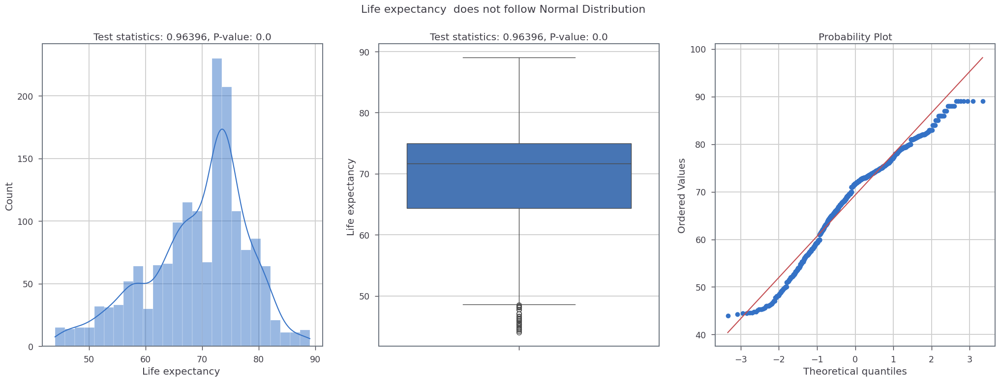

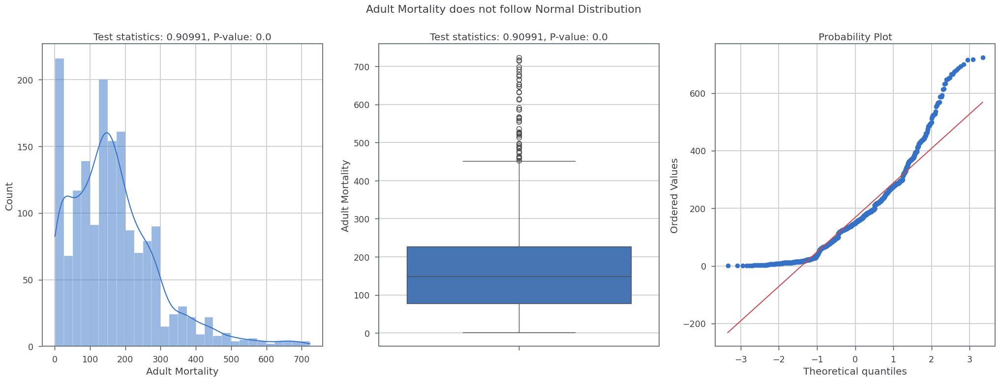

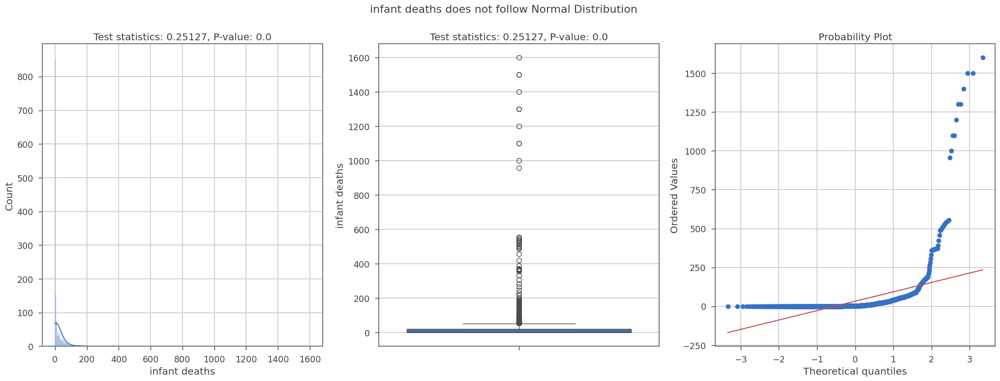

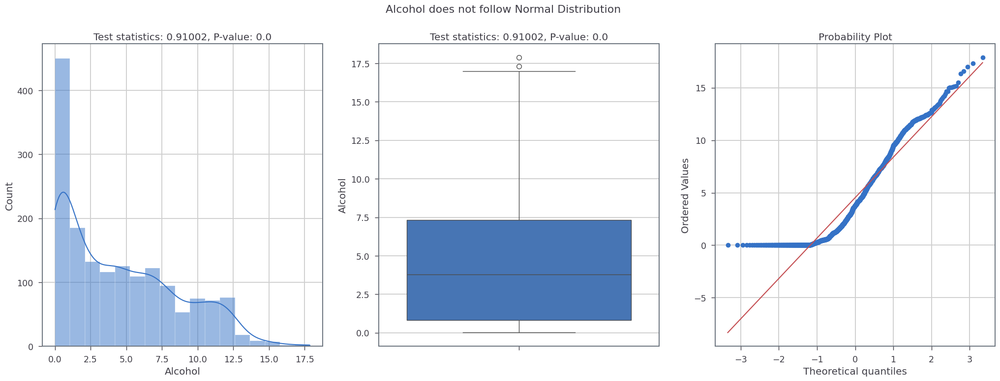

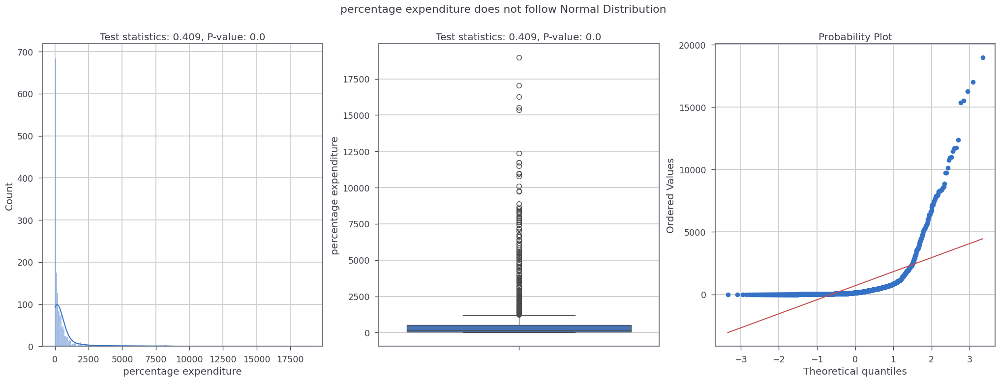

...

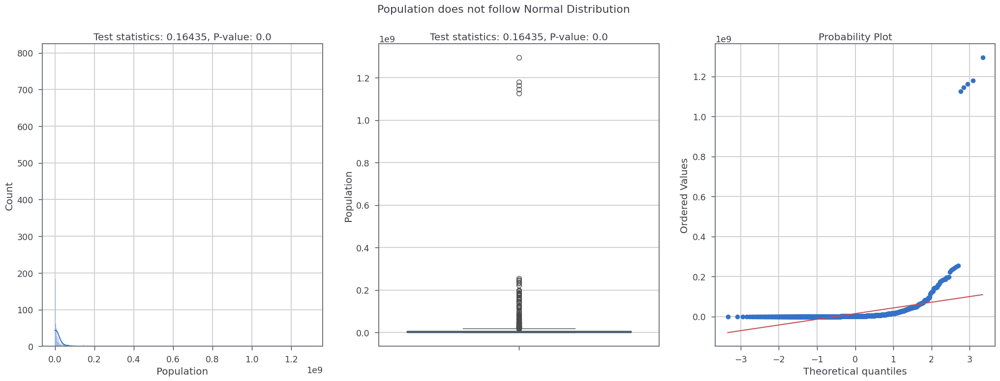

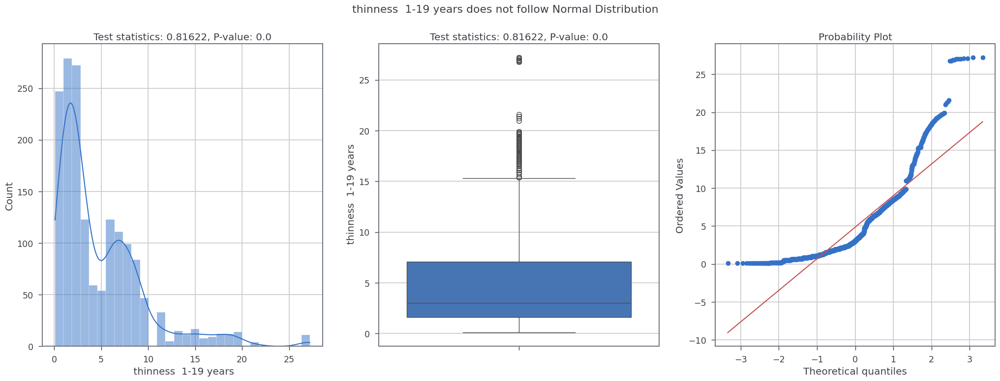

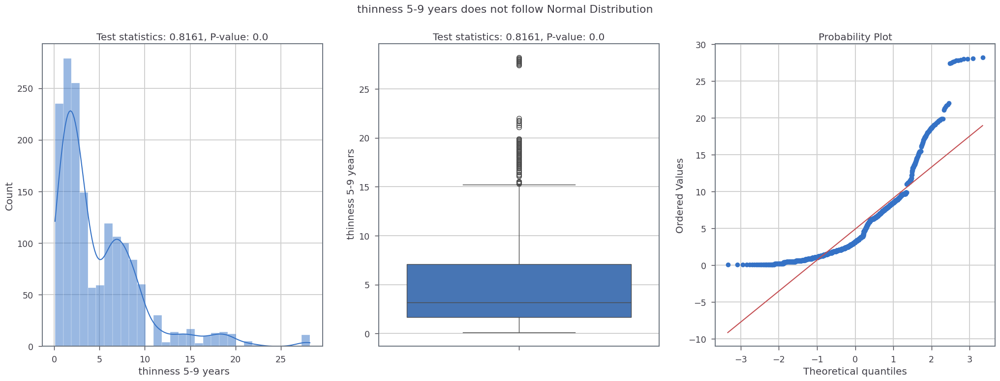

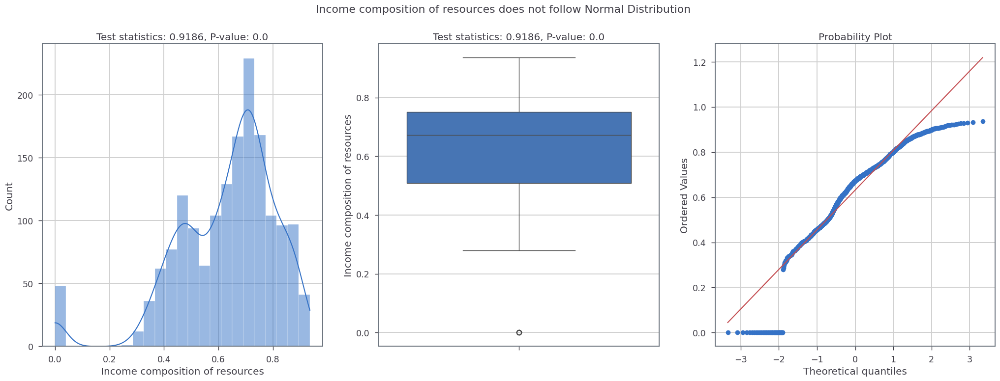

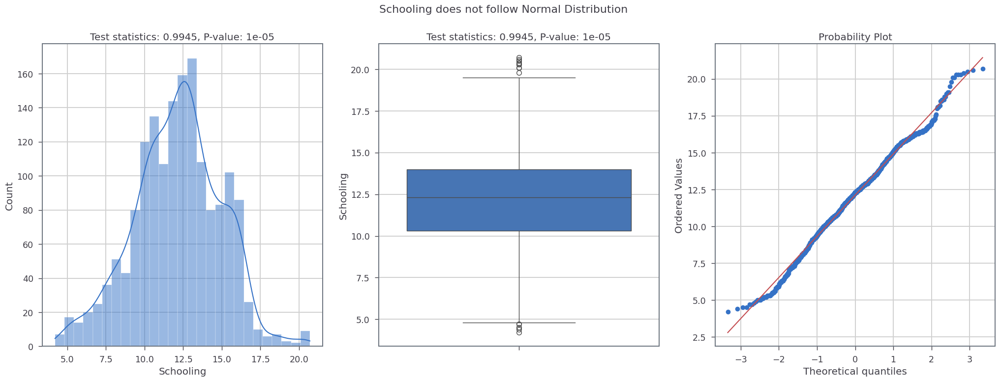

In [11]:
def plotNormalityTest(feature=None,new_data=None):
  fig,ax = plt.subplots(1,3,figsize=(25,8))
  new_data.dropna(inplace=True)
  statistics, p_value = shapiro(new_data[feature])
  ax[0].set_title(f'Test statistics: {np.round(statistics,5)}, P-value: {np.round(p_value,5)}')
  ax[1].set_title(f'Test statistics: {np.round(statistics,5)}, P-value: {np.round(p_value,5)}')
  if p_value <= 0.05:
      fig.suptitle(f'{feature} does not follow Normal Distribution')
  else:
      fig.suptitle(f'{feature} follows Normal Distribution')

  sns.histplot(new_data[feature], ax=ax[0], kde=True)
  sns.boxplot(new_data[feature], ax=ax[1])
  stats.probplot(new_data[feature], plot=ax[2])
  plt.show()
  print('\n\n')

for feature in numericalFeatures:
  plotNormalityTest(feature,data)

### D'Agostino's K^2 Test

- H0 (null hypothesis) :- The feature follows Normal Distribution
- H1 (alternative hypothesis) :- The feature not follows Normal Distribution

If P-value less than the 0.05 we have enough evidance to reject the null hypothesis and go with alternative hypothesis

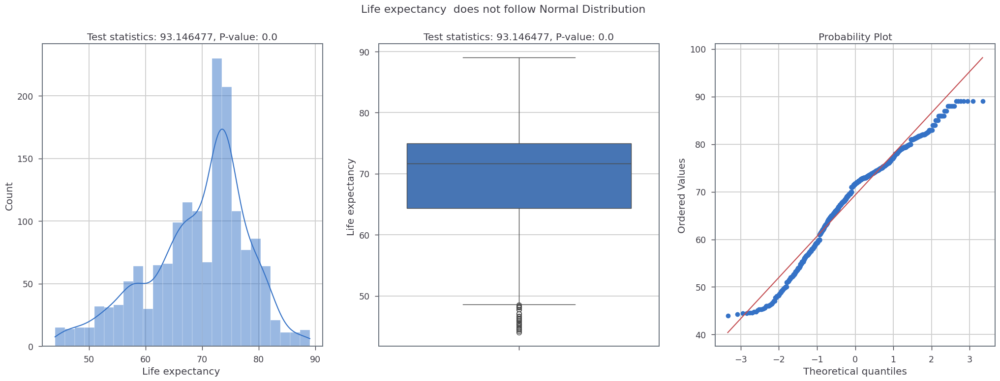

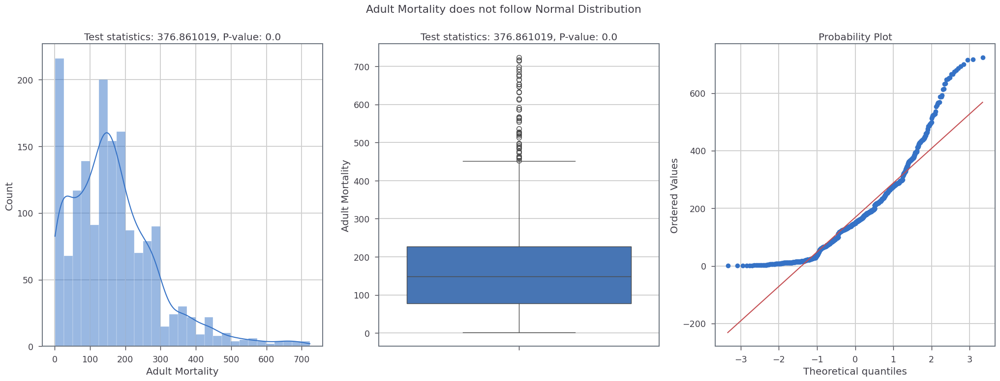

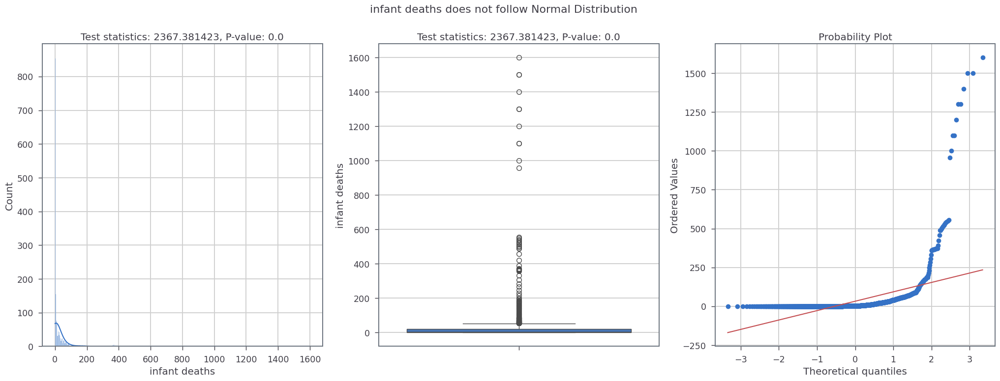

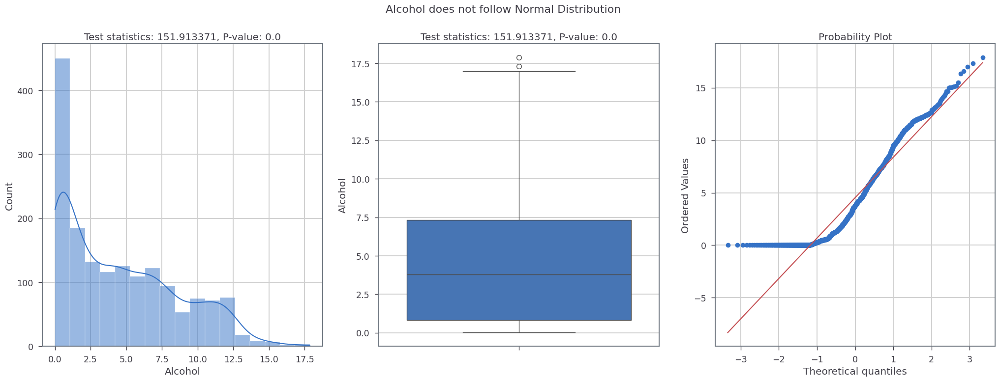

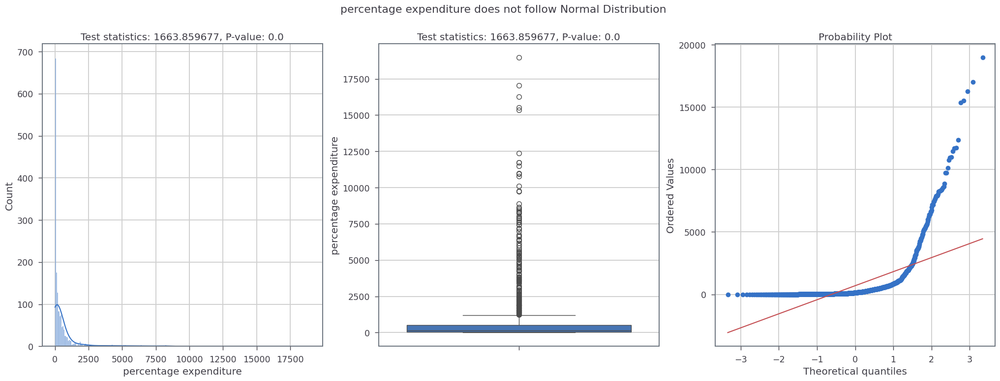

...

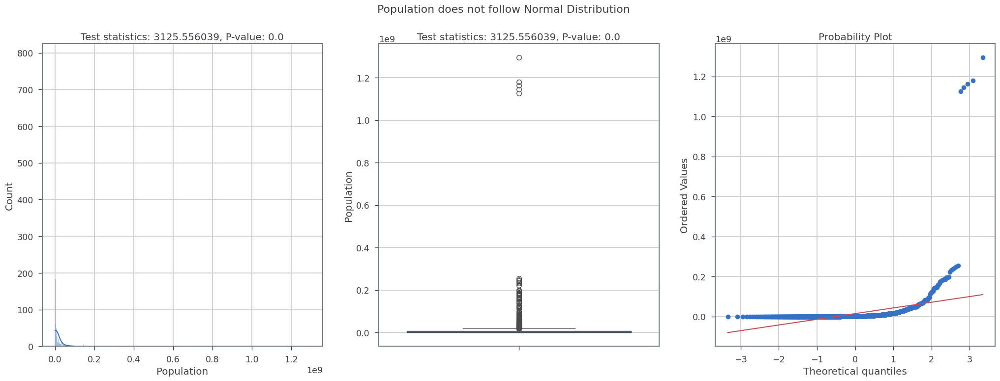

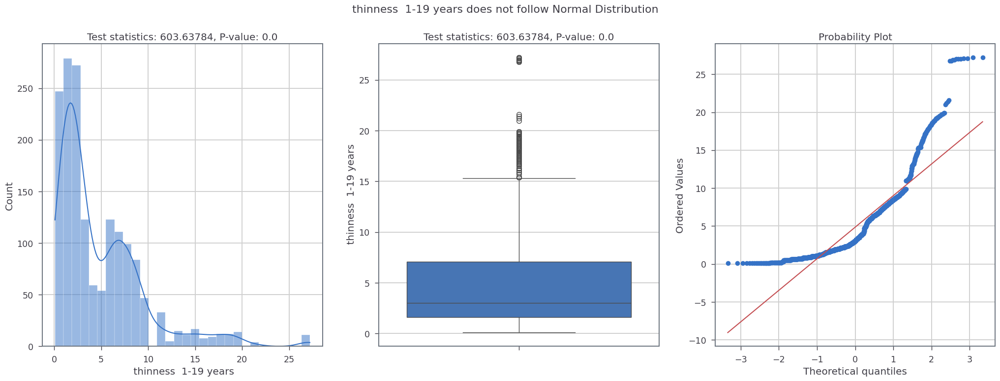

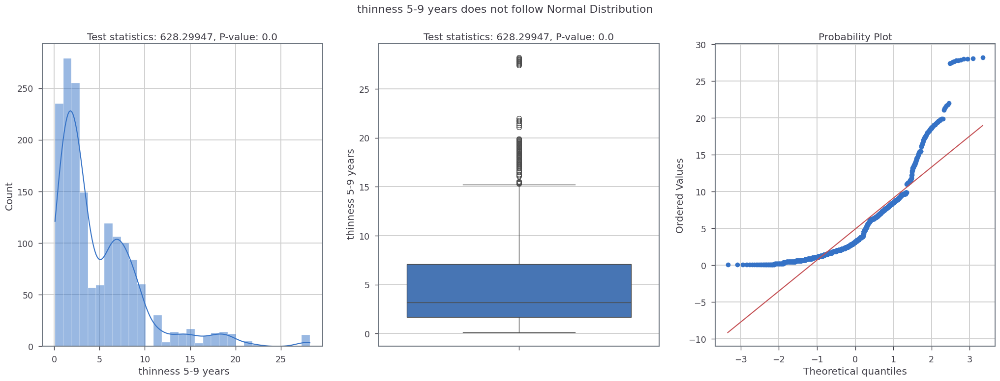

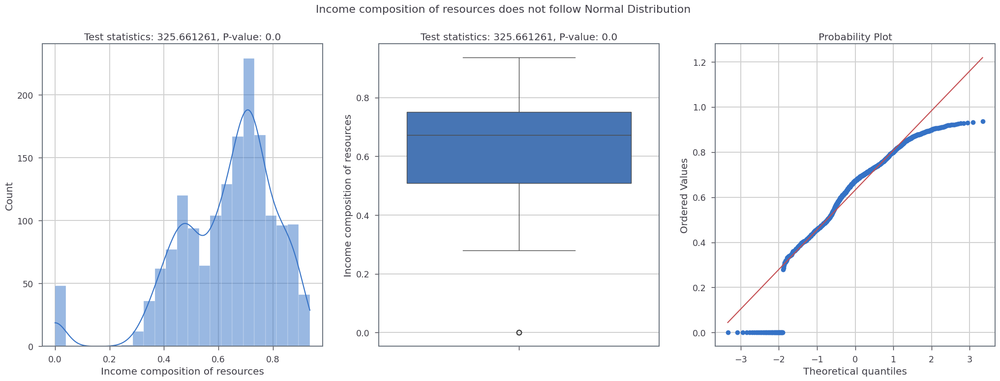

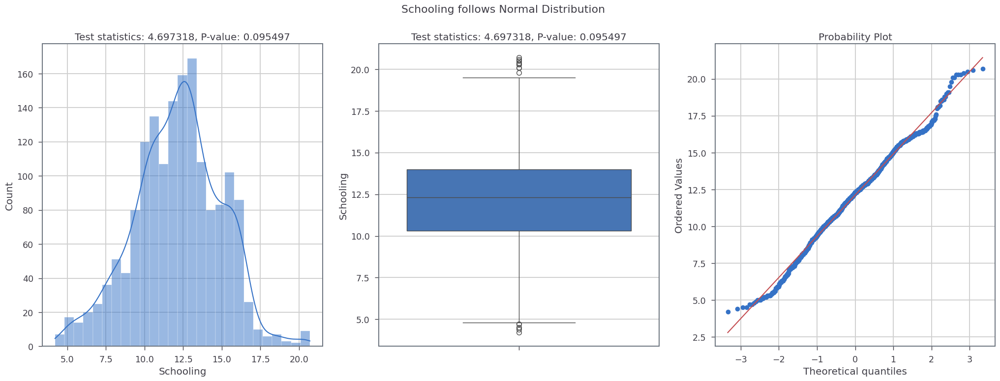

In [12]:

def plotNormalityTest(feature=None,new_data=None):

  fig,ax = plt.subplots(1,3,figsize=(25,8))
  new_data.dropna(inplace=True)
  statistics, p_value = normaltest(new_data[feature])
  ax[0].set_title(f'Test statistics: {np.round(statistics,6)}, P-value: {np.round(p_value,6)}')
  ax[1].set_title(f'Test statistics: {np.round(statistics,6)}, P-value: {np.round(p_value,6)}')
  if p_value <= 0.05:
      fig.suptitle(f'{feature} does not follow Normal Distribution')
  else:
      fig.suptitle(f'{feature} follows Normal Distribution')

  sns.histplot(new_data[feature], ax=ax[0], kde=True)
  sns.boxplot(new_data[feature], ax=ax[1])
  stats.probplot(new_data[feature], plot=ax[2])
  plt.show()
  print('\n\n')

for feature in numericalFeatures:
  plotNormalityTest(feature,data)

#### Observation
  - Skewed (Not following the normal Distribution)
  - Outliers


## Multi-variant Analysis

### Hypotheses for Pearson Correlation Coefficient

In hypothesis testing with Pearson's correlation coefficient \( r \), we typically consider the following hypotheses:

- **Null Hypothesis (\( H_0 \)):**
  The null hypothesis states that there is no significant linear relationship between the two variables being studied.
  \[ H_0: r = 0 \]

- **Alternative Hypothesis (\( H_1 \)):**
  The alternative hypothesis contradicts the null hypothesis and suggests that there is a significant linear relationship between the two variables.
  \[ H_1: r \neq 0 \]
  (Or depending on the research question, it could be one-tailed, either positive or negative.)

When conducting hypothesis testing using Pearson's correlation coefficient, we aim to determine whether the observed correlation coefficient is significantly different from zero. If the p-value associated with the correlation coefficient is smaller than a predetermined significance level (often denoted as \( \alpha \)), typically 0.05, then we reject the null hypothesis in favor of the alternative hypothesis, concluding that there is evidence of a significant linear relationship between the variables. Otherwise, if the p-value is greater than \( \alpha \), we fail to reject the null hypothesis, suggesting insufficient evidence to claim a significant linear relationship.


In [13]:
def pearsonrTestPlot(feature,target,new_data):
  new_data = new_data.dropna()
  fig, ax = plt.subplots(1, 2, figsize=(20, 5))
  pearsonr_statistics,pearsonr_p_value = pearsonr(new_data[feature], new_data[target])
  spearmanr_statistics,spearmanr_p_value = spearmanr(new_data[feature], new_data[target])
  if pearsonr_p_value < 0.05 and spearmanr_p_value < 0.05:
    fig.suptitle(f"""{feature} and {target} are probabily dependent
    pearsonr p-value : {np.round(pearsonr_p_value,5)} & pearsonr corr : {np.round(pearsonr_statistics,5)}
    spearmanr p-value : {np.round(spearmanr_p_value,5)} & spearmanr corr : {np.round(spearmanr_statistics,5)}
                 """,fontsize=10)
  else:
    fig.suptitle(f"""{feature} and {target} are probabily dependent
    pearsonr p-value : {np.round(pearsonr_p_value,5)} & pearsonr corr : {np.round(pearsonr_statistics,5)}
    spearmanr p-value : {np.round(spearmanr_p_value,5)} & spearmanr corr : {np.round(spearmanr_statistics,5)}
                 """,fontsize=10)

  # Plot a scatter plot in the first subplot (ax[0])
  ax[0].scatter(new_data[feature], new_data[target])
  ax[0].set_xlabel(f'{feature}')
  ax[0].set_ylabel(f'{target}')

  # Using Seaborn to create a regression plot in the second subplot (ax[1])
  sns.regplot(data=new_data, x=new_data[feature], y=new_data[target], ax=ax[1])
  ax[1].set_xlabel(f'{feature}')
  ax[1].set_ylabel(f'{target}')

  plt.show()
  print('\n\n')

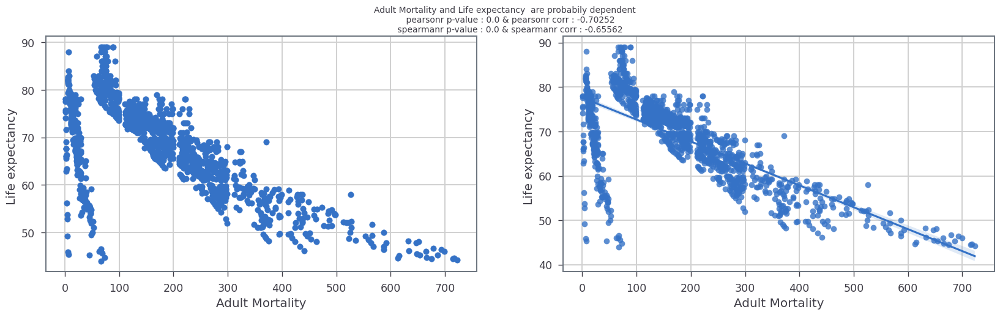

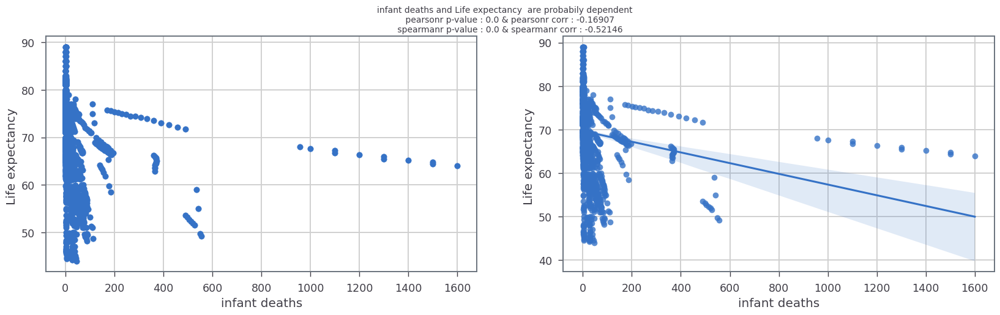

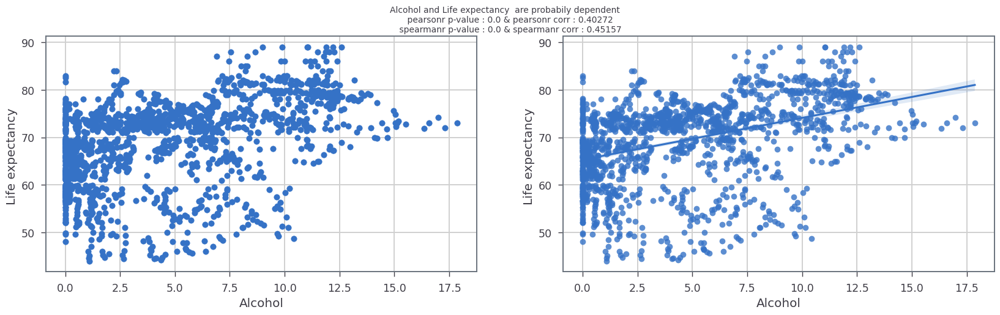

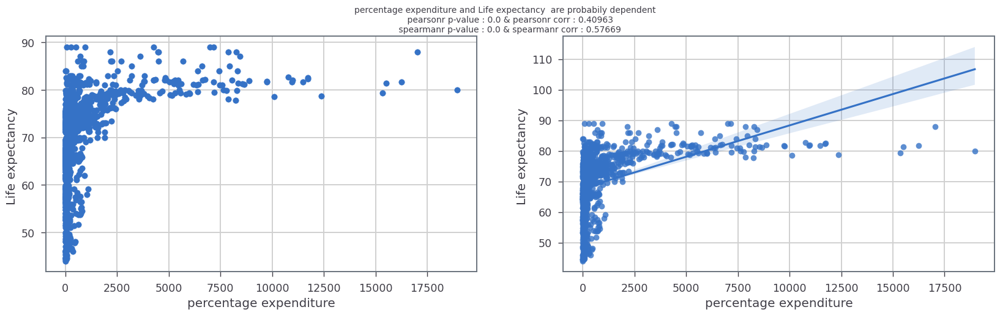

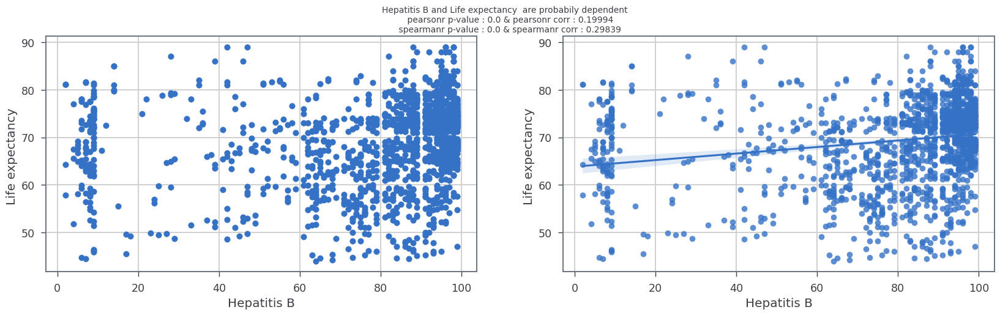

...

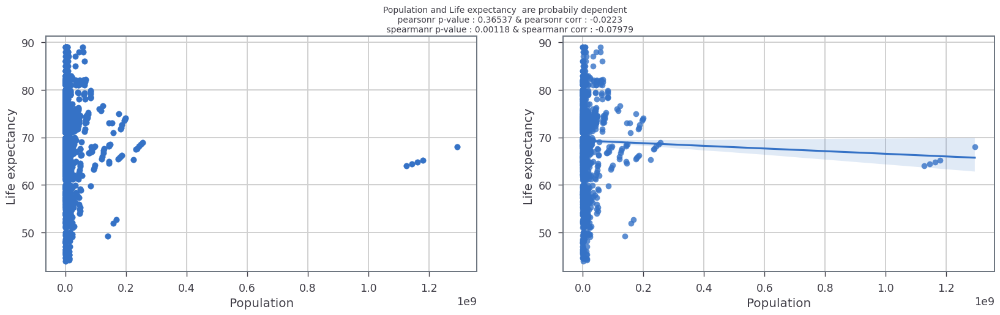

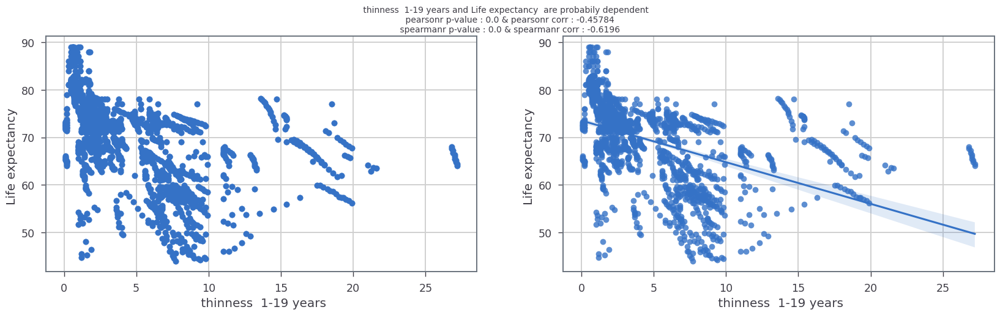

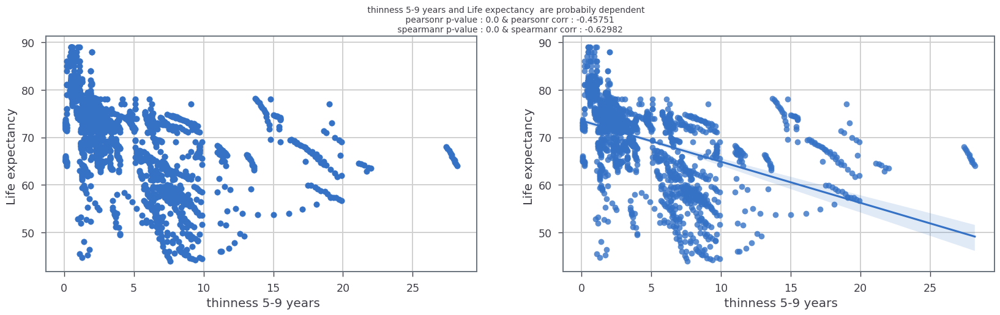

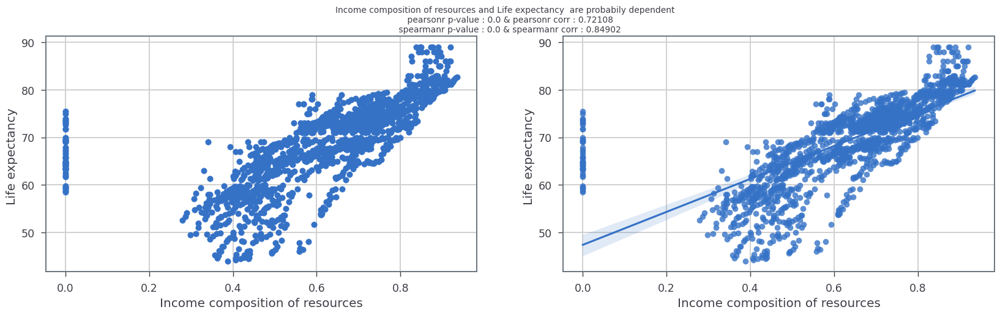

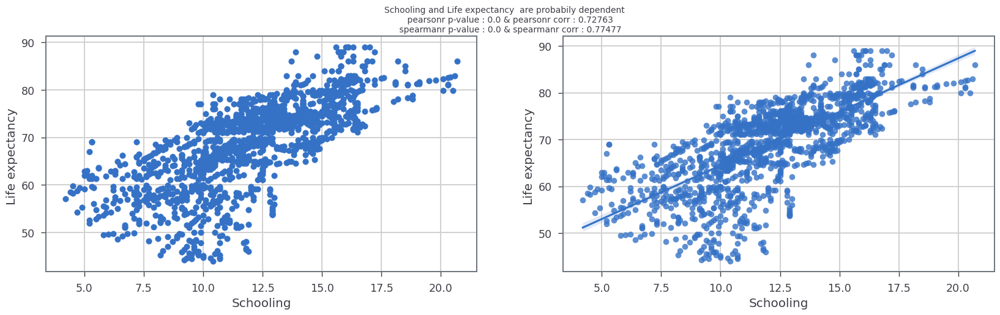

In [14]:
for feature in numericalFeatures:
  if feature != 'Life expectancy ':
    pearsonrTestPlot(feature,'Life expectancy ',data)

In [16]:
def getLifeExpectancyCountryPerYear(asc=True):
  Years_list = sorted(data['Year'].unique())
  # This part is to find the highest or lowest life expectany country of each year

  listOfLifeExpectancyValues = list()

  for year in Years_list:
    value = data.query(f"Year == {year}") \
    .groupby(['Country','Year']).agg({'Life expectancy':'min'}) \
    .reset_index() \
    .sort_values(by='Life expectancy',ascending=asc) \
    .iloc[0]

    listOfLifeExpectancyValues.append(value)
    lifeExpectancyCountryPerYear = pd.concat(listOfLifeExpectancyValues,axis=1).T

    # This part will plot the graph that shows the life expectancy

  fig, ax = plt.subplots(figsize=(20, 8))
  if asc:
    fig.suptitle('Countries with least life expectancy ("Life Expectancy Over Years")' )
  else:
    fig.suptitle('Countries with highest life expectancy ("Life Expectancy Over Years")')

  # Plot the life expectancy over years
  ax.plot(lifeExpectancyCountryPerYear['Year'],
            lifeExpectancyCountryPerYear['Life expectancy'],
            marker='o',
            linestyle='-')

  for i, txt in enumerate(lifeExpectancyCountryPerYear['Country']):
        plt.annotate(txt,
        (lifeExpectancyCountryPerYear['Year'].iloc[i],
          lifeExpectancyCountryPerYear['Life expectancy'].iloc[i]),
                    textcoords="offset points", xytext=(0,10),
                    ha='center',rotation=15)  # Add text annotation

  ax.set_xlabel('Year')
  ax.set_ylabel('Life Expectancy')
  ax.grid(True)

  plt.show()

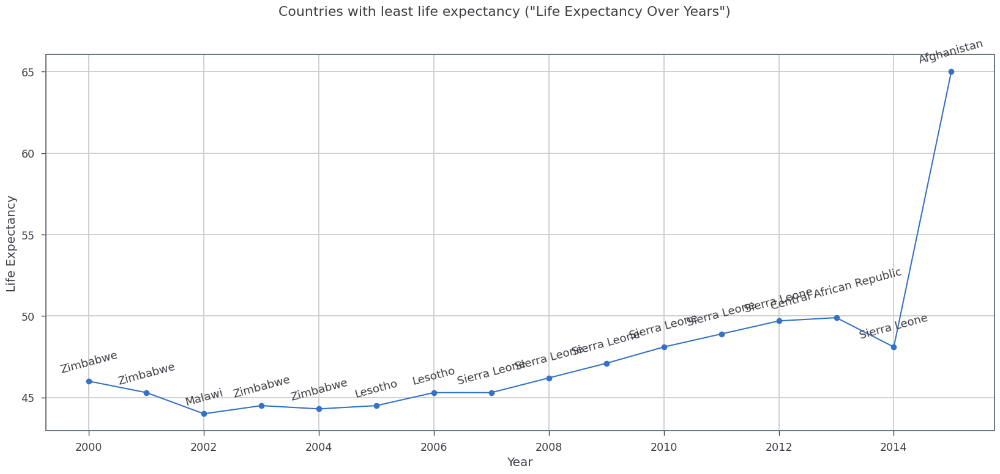

In [17]:
getLifeExpectancyCountryPerYear(True)

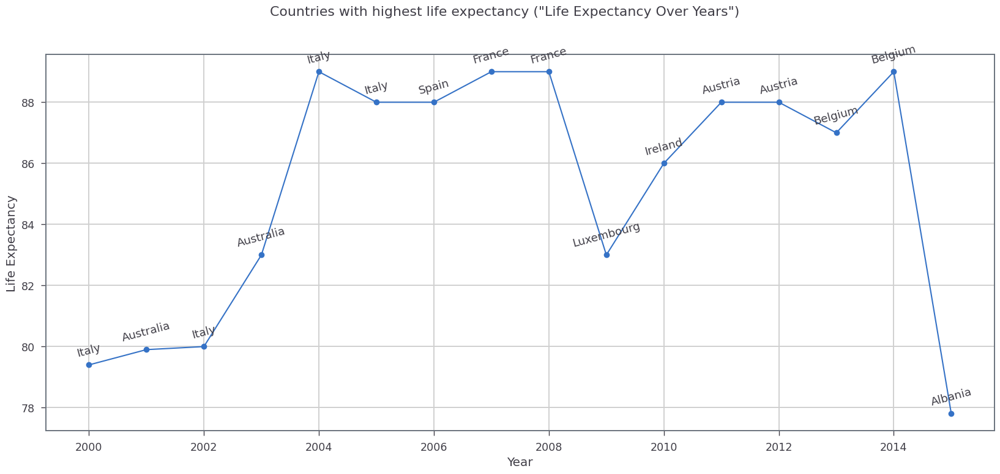

In [18]:
getLifeExpectancyCountryPerYear(False)

### Hypotheses for chi2_contingency

**Null Hypothesis (H0):** The null hypothesis states that there is no association between the categorical variables being studied. In other words, it assumes that the variables are independent.

**Alternative Hypothesis (H1):** The alternative hypothesis contradicts the null hypothesis and suggests that there is a statistically significant association between the categorical variables. It implies that the variables are dependent on each other.

For example, if you are conducting a chi-square test to analyze the relationship between two categorical variables such as gender and voting preference (e.g., Democrat, Republican, Independent), the null and alternative hypotheses would be:



In [143]:
def chi2_contingency_test(feature1):
  # Assuming 'categorical_feature' is your categorical feature and 'life_expectancy' is your target column
  crosstab = pd.crosstab(data[feature1], data['Life expectancy'])
  chi2, p, dof, expected = chi2_contingency(crosstab)
  if p < 0.05:
      print(f"The categorical {feature} is significant in predicting life expectancy (p-value < 0.05)")
  else:
      print(f"The categorical {feature} is not significant in predicting life expectancy (p-value >= 0.05)")
  num_obs = crosstab.sum().sum()
  cramers_v = np.sqrt(chi2 / (num_obs * (min(crosstab.shape) - 1)))

  print(f'cramers_v : {cramers_v}, P-value : {p}')

chi2_contingency_test('Year')


The categorical Schooling is significant in predicting life expectancy (p-value < 0.05)
cramers_v : 0.35773535287257346, P-value : 0.025116425899125605


In [144]:
chi2_contingency_test('Country')

The categorical Schooling is significant in predicting life expectancy (p-value < 0.05)
cramers_v : 0.3655122521200831, P-value : 1.5183496000719628e-49


In [145]:
chi2_contingency_test('Status')

The categorical Schooling is significant in predicting life expectancy (p-value < 0.05)
cramers_v : 0.6925505659894301, P-value : 8.7055409500588e-123


#### Observation
 - Status shows prominant significance in predicting Life expectancy
 - Where as Country and Year shows less significance in predecting life expectancy.

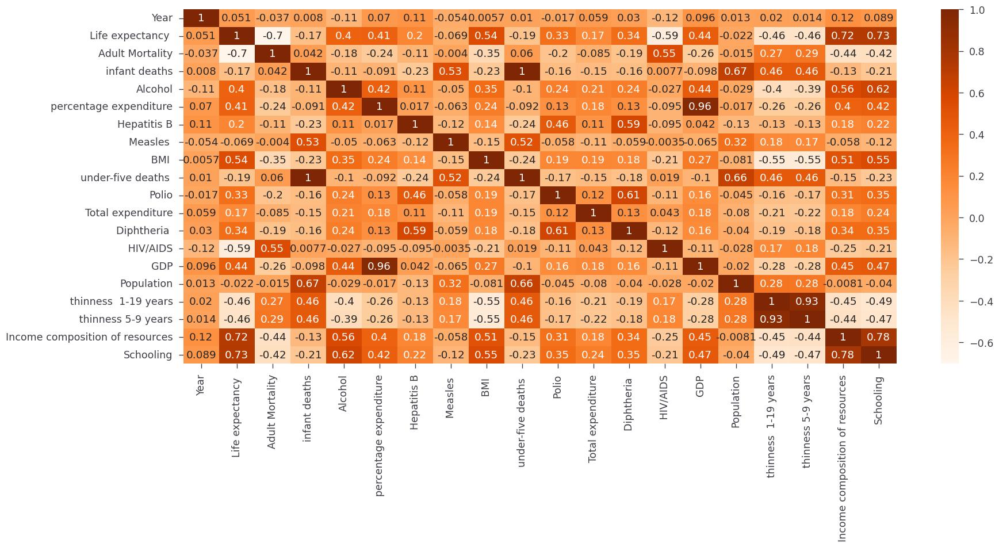

In [31]:
plt.figure(figsize=(20,8))
sns.heatmap(data.corr(numeric_only=True,method='pearson'),annot=True,cmap='Oranges')
plt.show()

https://www.analyticsvidhya.com/blog/2020/03/what-is-multicollinearity/

https://www.datasklr.com/ols-least-squares-regression/multicollinearity

In [21]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [108]:
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif["Pearsonr_corr"] = [np.round(pearsonr(X[column],data.dropna().sample(X.shape[0])[numericalFeatures[0]])[0],4) for column in X.columns]
    vif["Spearman_corr"] = [np.round(spearmanr(X[column],data.dropna().sample(X.shape[0])[numericalFeatures[0]])[0],4) for column in X.columns]
    return vif

In [23]:
vif_data = calc_vif(data[numericalFeatures[1:]])

In [24]:
vif_data \
.style \
.background_gradient(cmap='Oranges', axis=0)

,variables,VIF,Pearsonr_corr,Spearman_corr
0,Adult Mortality,4.160178,-0.702500,-0.655600
1,infant deaths,222.073491,-0.169100,-0.521500
2,Alcohol,4.070163,0.402700,0.451600
3,percentage expenditure,14.825787,0.409600,0.576700
4,Hepatitis B,17.396978,0.199900,0.298400
5,Measles,1.571070,-0.068900,-0.249600
6,BMI,8.287476,0.542000,0.583600
7,under-five deaths,210.862351,-0.192300,-0.538400
8,Polio,24.893553,0.327300,0.435300
9,Total expenditure,8.139036,0.174700,0.271100


In [28]:
vif_data.loc[vif_data['VIF'] < 5] \
.style \
.background_gradient(cmap='Oranges', axis=0)

,variables,VIF,Pearsonr_corr,Spearman_corr
0,Adult Mortality,4.160178,-0.702500,-0.655600
2,Alcohol,4.070163,0.402700,0.451600
5,Measles,1.571070,-0.068900,-0.249600
11,HIV/AIDS,1.632647,-0.592200,-0.720300
13,Population,2.013897,-0.022300,-0.079800


In [29]:
vif_data.loc[vif_data['VIF'] > 5] \
.style \
.background_gradient(cmap='Oranges', axis=0)

,variables,VIF,Pearsonr_corr,Spearman_corr
1,infant deaths,222.073491,-0.169100,-0.521500
3,percentage expenditure,14.825787,0.409600,0.576700
4,Hepatitis B,17.396978,0.199900,0.298400
6,BMI,8.287476,0.542000,0.583600
7,under-five deaths,210.862351,-0.192300,-0.538400
8,Polio,24.893553,0.327300,0.435300
9,Total expenditure,8.139036,0.174700,0.271100
10,Diphtheria,33.100694,0.341300,0.448200
12,GDP,16.554311,0.441300,0.570800
14,thinness 1-19 years,15.792641,-0.457800,-0.619600


In [95]:
features_to_drop = ['Income composition of resources','infant deaths','under-five deaths','thinness  1-19 years','thinness 5-9 years','Year','Country','percentage expenditure']

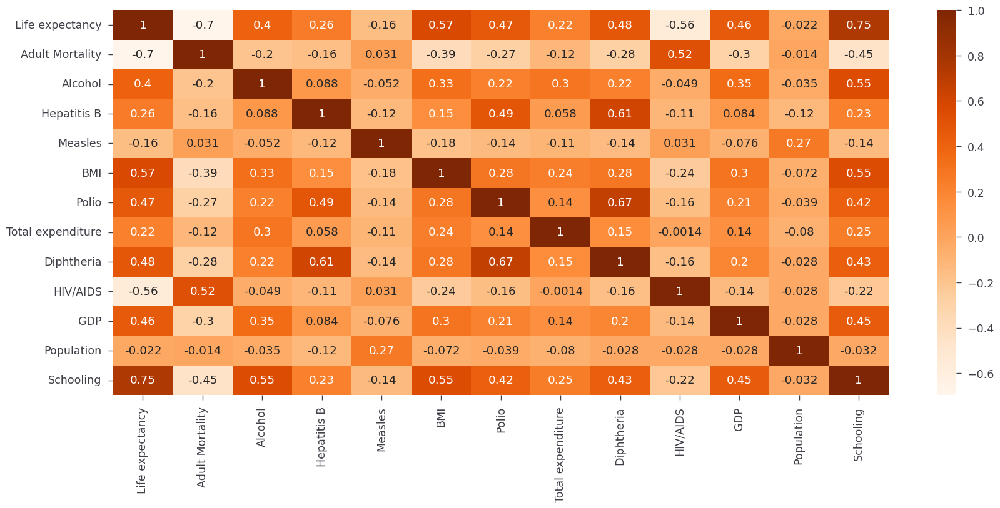

In [101]:
non_multicorrelation_data = data.drop(columns=features_to_drop,axis=1).select_dtypes(exclude='object')

plt.figure(figsize=(20,8))
sns.heatmap(non_multicorrelation_data.corr(method='pearson'),annot=True,cmap='Oranges')
plt.show()

non_multicorrelation_data = list(non_multicorrelation_data.columns)

In [111]:
vif_data = calc_vif(data[non_multicorrelation_data].dropna().drop('Life expectancy',axis=1))

In [113]:
vif_data.loc[vif_data['VIF'] < 5] \
.style \
.background_gradient(cmap='Oranges', axis=0)

,variables,VIF,Pearsonr_corr,Spearman_corr
0,Adult Mortality,3.681634,0.017000,0.017100
1,Alcohol,3.586017,0.024300,-0.007100
3,Measles,1.184584,-0.021000,0.003300
8,HIV/AIDS,1.622471,0.004000,0.029800
9,GDP,1.671272,0.021300,-0.037400
10,Population,1.177964,-0.016000,-0.005400


In [79]:
final_features = list(non_multicorrelation_data.columns)
final_features.append('Life expectancy')

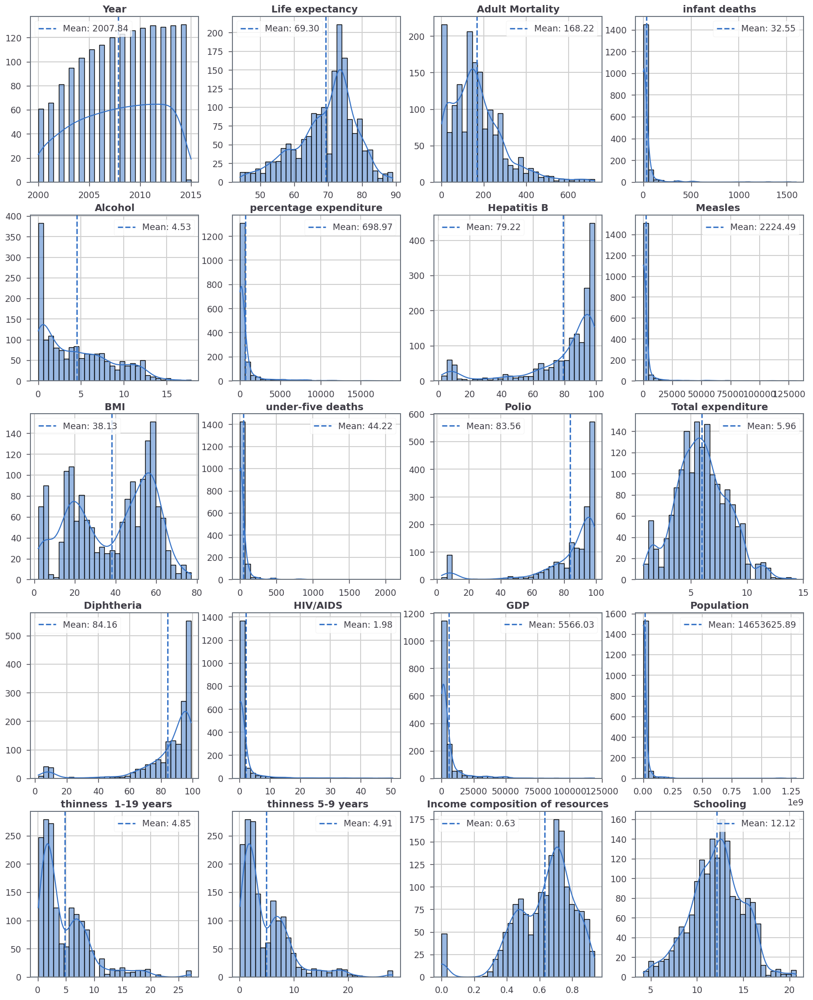

In [25]:
# numeric_features = data.select_dtypes(exclude=['object']).columns

# fig,ax = plt.subplots(5,4,figsize=(20,25))

# for col,ax in zip(numeric_features,ax.flatten()):
#   sns.histplot(data[col], bins=30, kde=True, ax=ax, edgecolor='black', linewidth=1)

#     # Title for each subplot
#   ax.set_title(col, fontsize=14, fontweight='bold')

#     # Set axis labels
#   ax.set_xlabel('')
#   ax.set_ylabel('')

#     # Add vertical line at mean if desired
#   mean_value = data[col].mean()
#   ax.axvline(mean_value, linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
#   ax.legend()


